In [1]:
# fmt: off
import urllib
from IPython.display import Markdown as md

### change to reflect your notebook
_nb_loc = "11_adv_problems/11c_scann_search.ipynb"
_nb_title = "Searching for embeddings"
_icons=["https://raw.githubusercontent.com/GoogleCloudPlatform/practical-ml-vision-book/master/logo-cloud.png", "https://www.tensorflow.org/images/colab_logo_32px.png", "https://www.tensorflow.org/images/GitHub-Mark-32px.png", "https://www.tensorflow.org/images/download_logo_32px.png"]
_links=["https://console.cloud.google.com/vertex-ai/workbench/deploy-notebook?" + urllib.parse.urlencode({"name": _nb_title, "download_url": "https://github.com/takumiohym/practical-ml-vision-book-ja/raw/master/"+_nb_loc}), "https://colab.research.google.com/github/takumiohym/practical-ml-vision-book-ja/blob/master/{0}".format(_nb_loc), "https://github.com/takumiohym/practical-ml-vision-book-ja/blob/master/{0}".format(_nb_loc), "https://raw.githubusercontent.com/takumiohym/practical-ml-vision-book-ja/master/{0}".format(_nb_loc)]
md("""<table class="tfo-notebook-buttons" align="left"><td><a target="_blank" href="{0}"><img src="{4}"/>Run in Vertex AI Workbench</a></td><td><a target="_blank" href="{1}"><img src="{5}" />Run in Google Colab</a></td><td><a target="_blank" href="{2}"><img src="{6}" />View source on GitHub</a></td><td><a href="{3}"><img src="{7}" />Download notebook</a></td></table><br/><br/>""".format(_links[0], _links[1], _links[2], _links[3], _icons[0], _icons[1], _icons[2], _icons[3]))
# fmt: on

<table class="tfo-notebook-buttons" align="left"><td><a target="_blank" href="https://console.cloud.google.com/vertex-ai/workbench/deploy-notebook?name=Searching+for+embeddings&download_url=https%3A%2F%2Fgithub.com%2Ftakumiohym%2Fpractical-ml-vision-book-ja%2Fraw%2Fmaster%2F11_adv_problems%2F11c_scann_search.ipynb"><img src="https://raw.githubusercontent.com/GoogleCloudPlatform/practical-ml-vision-book/master/logo-cloud.png"/>Run in Vertex AI Workbench</a></td><td><a target="_blank" href="https://colab.research.google.com/github/takumiohym/practical-ml-vision-book-ja/blob/master/11_adv_problems/11c_scann_search.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab</a></td><td><a target="_blank" href="https://github.com/takumiohym/practical-ml-vision-book-ja/blob/master/11_adv_problems/11c_scann_search.ipynb"><img src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />View source on GitHub</a></td><td><a href="https://raw.githubusercontent.com/takumiohym/practical-ml-vision-book-ja/master/11_adv_problems/11c_scann_search.ipynb"><img src="https://www.tensorflow.org/images/download_logo_32px.png" />Download notebook</a></td></table><br/><br/>

# 埋め込みの検索  
このノートブックは、埋め込みとSCaNNを使用して高速画像検索を実装する方法を示しています。

## 環境設定
以下を実行し、カーネルを再起動してください。

In [3]:
!pip install --user scann==1.2.5 tensorflow-addons==0.16.1

**カーネルを再起動してから次に進んでください。**

Colab環境を利用する場合、以下を実行して必要なファイルのダウンロードをしてください。

In [1]:
import os

IS_COLAB_BACKEND = 'COLAB_RELEASE_TAG' in os.environ  # this is always set on Colab
if IS_COLAB_BACKEND:
    # Get files
    BASE_PATH = "https://raw.githubusercontent.com/takumiohym/practical-ml-vision-book-ja/main/11_adv_problems"
    !wget {BASE_PATH}/embedding_projection.png

このノートブックは、GPUで動作します。

In [2]:
import tensorflow as tf

print(tf.version.VERSION)
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
    pass
    # raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

2.8.2
Found GPU at: /device:GPU:0


2022-12-13 20:04:34.180414: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-12-13 20:04:34.820672: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-13 20:04:34.831591: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-13 20:04:34.832258: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zer

## 埋め込みのインデックスを作成する  

事前にトレーニングされたMobileNetモデルを使用して、Flowerデータセット内の100枚の画像の埋め込みを作成します  


In [3]:
import matplotlib.pylab as plt
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_addons as tfa
import scann
import os

os.environ['TFHUB_MODEL_LOAD_FORMAT'] = 'UNCOMPRESSED'

IMG_HEIGHT = 224
IMG_WIDTH = 224
IMG_CHANNELS = 3
BATCH_SIZE = 32
CLASS_NAMES = ['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']


def read_and_decode(filename, reshape_dims=[IMG_HEIGHT, IMG_WIDTH]):
    # Read the file
    img = tf.io.read_file(filename)
    # Convert the compressed string to a 3D uint8 tensor.
    img = tf.image.decode_jpeg(img, channels=IMG_CHANNELS)
    # Use `convert_image_dtype` to convert to floats in the [0,1] range.
    img = tf.image.convert_image_dtype(img, tf.float32)
    # Resize the image to the desired size.
    return tf.image.resize(img, reshape_dims)

def decode_csv(csv_row):
    record_defaults = ["path", "flower"]
    filename, label_string = tf.io.decode_csv(csv_row, record_defaults)
    img = read_and_decode(filename, [IMG_WIDTH, IMG_HEIGHT])
    label = tf.argmax(tf.math.equal(CLASS_NAMES, label_string))
    return filename, img, label, label_string

In [4]:
layers = [
      hub.KerasLayer(
          "https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4",
          input_shape=(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS),
          trainable=False,
          name='mobilenet_embedding')
]
backbone = tf.keras.Sequential(layers, name='flowers_embedding')
print(backbone.summary())

2022-12-13 20:04:36.143462: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-13 20:04:36.144185: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-13 20:04:36.144755: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-13 20:04:36.145702: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-13 20:04:36.146425: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from S

Model: "flowers_embedding"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_embedding (KerasL  (None, 1280)             2257984   
 ayer)                                                           
                                                                 
Total params: 2,257,984
Trainable params: 0
Non-trainable params: 2,257,984
_________________________________________________________________
None


In [5]:
def create_embeddings_dataset(embedder, csvfilename, num_images, shuffle=False):
    ds = tf.data.TextLineDataset(csvfilename).map(decode_csv)
    if shuffle:
        ds = ds.shuffle(10000)
    ds = ds.take(num_images).batch(BATCH_SIZE)
    dataset_filenames = []
    dataset_embeddings = []
    for filenames, images, _, _ in ds:
        embeddings = embedder(images)
        dataset_filenames.extend([f.numpy().decode('utf-8') for f in filenames])
        dataset_embeddings.extend(embeddings)
    dataset_embeddings = tf.convert_to_tensor(dataset_embeddings)
    return dataset_filenames, dataset_embeddings

In [6]:
NUM_IMAGES = 10000 # Number of the data to search
NUM_NEIGH = 3 # top N 

dataset_filenames, dataset_embeddings = create_embeddings_dataset(
    lambda x: backbone.predict(x),
    "gs://practical-ml-vision-book/flowers_5_jpeg/flower_photos/train_set.csv", NUM_IMAGES
)
print(dataset_filenames[:3])
print(dataset_embeddings.shape) # should be (NUM_IMAGES, 1280)

query_filenames, query_embeddings = create_embeddings_dataset(
    lambda x: backbone.predict(x),
    "gs://practical-ml-vision-book/flowers_5_jpeg/flower_photos/eval_set.csv", 10
)
print(query_embeddings.shape)

2022-12-13 20:04:40.593275: I tensorflow/stream_executor/cuda/cuda_dnn.cc:368] Loaded cuDNN version 8200


['gs://practical-ml-vision-book/flowers_5_jpeg/flower_photos/daisy/754296579_30a9ae018c_n.jpg', 'gs://practical-ml-vision-book/flowers_5_jpeg/flower_photos/dandelion/18089878729_907ed2c7cd_m.jpg', 'gs://practical-ml-vision-book/flowers_5_jpeg/flower_photos/dandelion/284497199_93a01f48f6.jpg']
(3300, 1280)
(10, 1280)


### SCANNの構築と利用

In [7]:
## Create SCaNN searcher
searcher = scann.scann_ops.builder(dataset_embeddings, NUM_NEIGH, "dot_product").score_ah(2).build()

2022-12-13 20:05:58.192170: I scann/base/single_machine_factory_scann.cc:124] Single-machine AH training with dataset size = 3300, 4 thread(s).


In [8]:
neighbors, similarities = searcher.search_batched(query_embeddings)
print(neighbors)
print(similarities)

tf.Tensor(
[[1343 2522 1151]
 [  95 2642 3235]
 [ 292 3250  814]
 [1483 3026 2098]
 [2329  254 1996]
 [  26 1027 2306]
 [2978 1962 1970]
 [ 155  635  356]
 [ 905 1620 1942]
 [1443  543  110]], shape=(10, 3), dtype=int32)
tf.Tensor(
[[446.89325 432.73584 423.1195 ]
 [442.96365 428.79135 396.35248]
 [373.07767 359.99066 358.03735]
 [407.60556 407.60556 396.61682]
 [533.7952  523.86487 509.50406]
 [384.51828 383.8546  366.20157]
 [242.5114  230.23633 222.52505]
 [443.56946 443.38834 423.46484]
 [451.98547 392.19904 388.61185]
 [455.62555 452.55447 434.3737 ]], shape=(10, 3), dtype=float32)


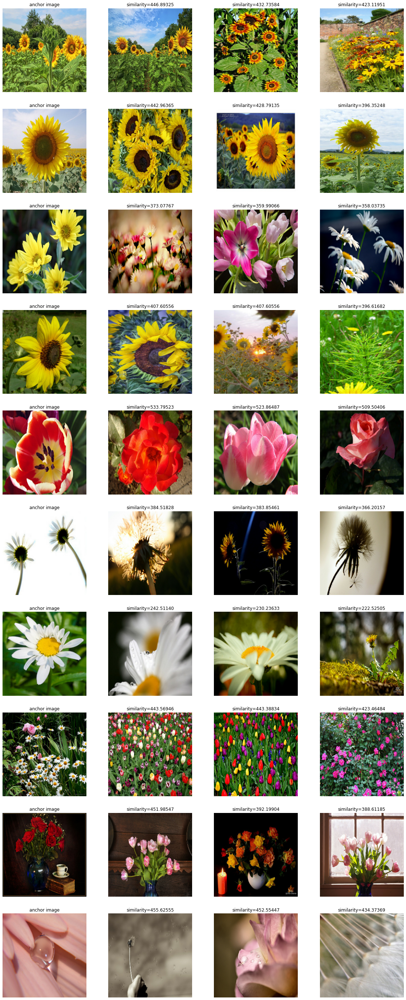

In [9]:
def plot_neighbors(query_filenames, neighbors, similarities):
    f, ax = plt.subplots(len(query_filenames), NUM_NEIGH + 1,
                         figsize=(5 * (1 + NUM_NEIGH), 5 * len(query_filenames)))
    for rowno, query_filename in enumerate(query_filenames):
        ax[rowno][0].imshow(read_and_decode(query_filename).numpy())
        ax[rowno][0].set_title('anchor image')
        ax[rowno][0].axis('off')
        for colno, neigh in enumerate(neighbors[rowno]):
            ax[rowno][colno+1].imshow(read_and_decode(dataset_filenames[neigh]).numpy())
            ax[rowno][colno+1].set_title('similarity={:.5f}'.format(similarities[rowno][colno].numpy()))
            ax[rowno][colno+1].axis('off')

plot_neighbors(query_filenames, neighbors, similarities)

結果は悪くありませんが、チューリップの画像に対して、似ている色のバラを結果として返していたり、黄色いデイジーとヒマワリを混在させているものもあるようです。

## トリプレットロスを用いたファインチューニング

続けて、分類用のラベルを使用して埋め込みをトレーニングします。  <br>
しかしここでのゴールは分類問題自体ではなく、より良い埋め込みを作成することです。<br>
そのために、トリプレット損失を使用し、特にセミハード損失を最小化するように設計します。このようにすることで、クラス内・クラス間の距離を考慮した、より検索に適した埋め込みができます。

参照:  
* https://arxiv.org/pdf/1503.03832.pdf  
* https://www.tensorflow.org/addons/tutorials/losses_triplet  
* https://omoindrot.github.io/triplet-loss  

**注: トリプレット損失は、それぞれのバッチの正のペアがない場合、最終的にNaNになるように定義されています。そのため、バッチサイズはこれが発生しないように十分に大きくする必要があります。**

In [10]:
layers = [
    hub.KerasLayer(
          "https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4",
          input_shape=(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS),
          trainable=True,
          name='mobilenet_embedding'),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(512, activation=None),
    tf.keras.layers.Lambda(lambda x: tf.math.l2_normalize(x, axis=1), name='normalize_embeddings')
]

triplet_loss_model = tf.keras.Sequential(layers, name='flowers_embedding')

triplet_loss_model.compile(optimizer=tf.keras.optimizers.Adam(0.0001), loss=tfa.losses.TripletSemiHardLoss())
print(triplet_loss_model.summary())

Model: "flowers_embedding"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_embedding (KerasL  (None, 1280)             2257984   
 ayer)                                                           
                                                                 
 dropout (Dropout)           (None, 1280)              0         
                                                                 
 dense (Dense)               (None, 512)               655872    
                                                                 
 normalize_embeddings (Lambd  (None, 512)              0         
 a)                                                              
                                                                 
Total params: 2,913,856
Trainable params: 2,879,744
Non-trainable params: 34,112
_________________________________________________________________
None


In [11]:
train_dataset = (tf.data.TextLineDataset(
    "gs://practical-ml-vision-book/flowers_5_jpeg/flower_photos/train_set.csv").
    map(decode_csv)).map(lambda path, img, lint, ls: (img, lint)).batch(BATCH_SIZE)

history = triplet_loss_model.fit(train_dataset.cache(), epochs=10)

Epoch 1/10
104/104 [==============================] - 74s 644ms/step - loss: 0.9007
Epoch 2/10
104/104 [==============================] - 22s 210ms/step - loss: 0.4487
Epoch 3/10
104/104 [==============================] - 22s 213ms/step - loss: 0.2197
Epoch 4/10
104/104 [==============================] - 22s 216ms/step - loss: 0.1404
Epoch 5/10
104/104 [==============================] - 23s 218ms/step - loss: 0.1115
Epoch 6/10
104/104 [==============================] - 22s 215ms/step - loss: 0.1021
Epoch 7/10
104/104 [==============================] - 22s 214ms/step - loss: 0.0979
Epoch 8/10
104/104 [==============================] - 22s 214ms/step - loss: 0.0923
Epoch 9/10
104/104 [==============================] - 22s 213ms/step - loss: 0.0920
Epoch 10/10
104/104 [==============================] - 22s 213ms/step - loss: 0.0913


In [12]:
# repeat with new model
dataset_filenames, dataset_embeddings = create_embeddings_dataset(
    lambda x: triplet_loss_model.predict(x),
    "gs://practical-ml-vision-book/flowers_5_jpeg/flower_photos/train_set.csv", NUM_IMAGES
)

query_filenames, query_embeddings = create_embeddings_dataset(
    lambda x: triplet_loss_model.predict(x),
    "gs://practical-ml-vision-book/flowers_5_jpeg/flower_photos/eval_set.csv", 10
)

In [13]:
searcher = scann.scann_ops.builder(dataset_embeddings, NUM_NEIGH, "dot_product").score_ah(2).build()
neighbors, similarities = searcher.search_batched(query_embeddings)

2022-12-13 20:12:00.222121: I scann/base/single_machine_factory_scann.cc:124] Single-machine AH training with dataset size = 3300, 4 thread(s).


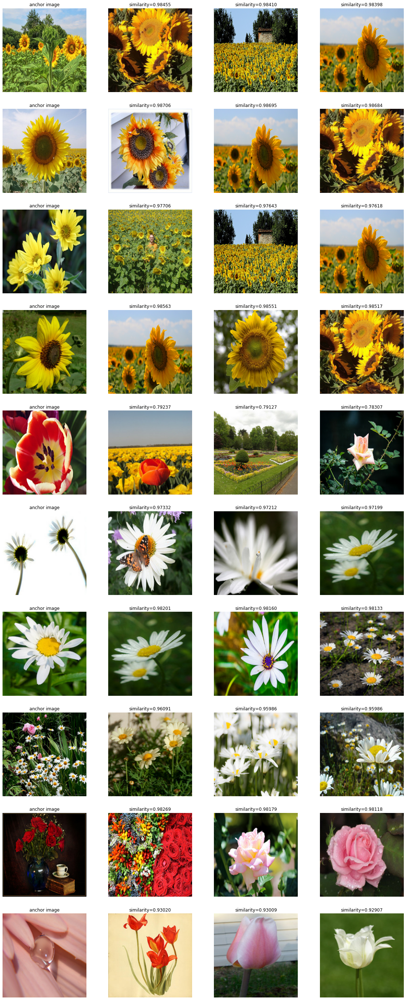

In [14]:
plot_neighbors(query_filenames, neighbors, similarities)

よりラベルを考慮した検索ができていることが確認できます。

## プロジェクターで埋め込みを表示する  

TensorFlow Embedding Projectorで表示するファイルを作成します

In [15]:
import io
import tensorflow_datasets as tfds

test_dataset = (tf.data.TextLineDataset(
    "gs://practical-ml-vision-book/flowers_5_jpeg/flower_photos/eval_set.csv").
    map(decode_csv)).map(lambda path, img, lint, ls: (img,lint)).take(NUM_IMAGES).batch(NUM_IMAGES)

triplet_results = triplet_loss_model.predict(test_dataset.map(lambda img, lint: img))

np.savetxt("vecs.tsv", triplet_results, delimiter='\t')

out_m = io.open('meta.tsv', 'w', encoding='utf-8')
for img, labels in tfds.as_numpy(test_dataset):
    [out_m.write(CLASS_NAMES[x] + "\n") for x in labels]
out_m.close()

以下の手順で埋め込みをアップロードし、表示してください。
1. 上のセルで作成された`vecs.tsv`と`meta.tsv`をダウンロード
2. https://projector.tensorflow.org/ へアクセス
3. 左側ウィンドウの `Load` をクリックし、`vecs.tsv` と`meta.tsv`をそれぞれアップロード
4. 左側ウィンドウ下から、可視化のために低次元へ次元縮約するアルゴリズムの選択（UMAP,T-SNEなど）

上記の手順で表示ができたら、以下の点をチェックしてみるとよいでしょう。
- 左側ウィンドウで、`Color by` に`Label`を指定し、ラベル毎に埋め込みがどのようにクラスタ化されているかを確認
- 表示された埋め込みの中からひとつの点をダブルクリックし、以下の画像のように右ウィンドウに近傍ベクトルが順々に表示


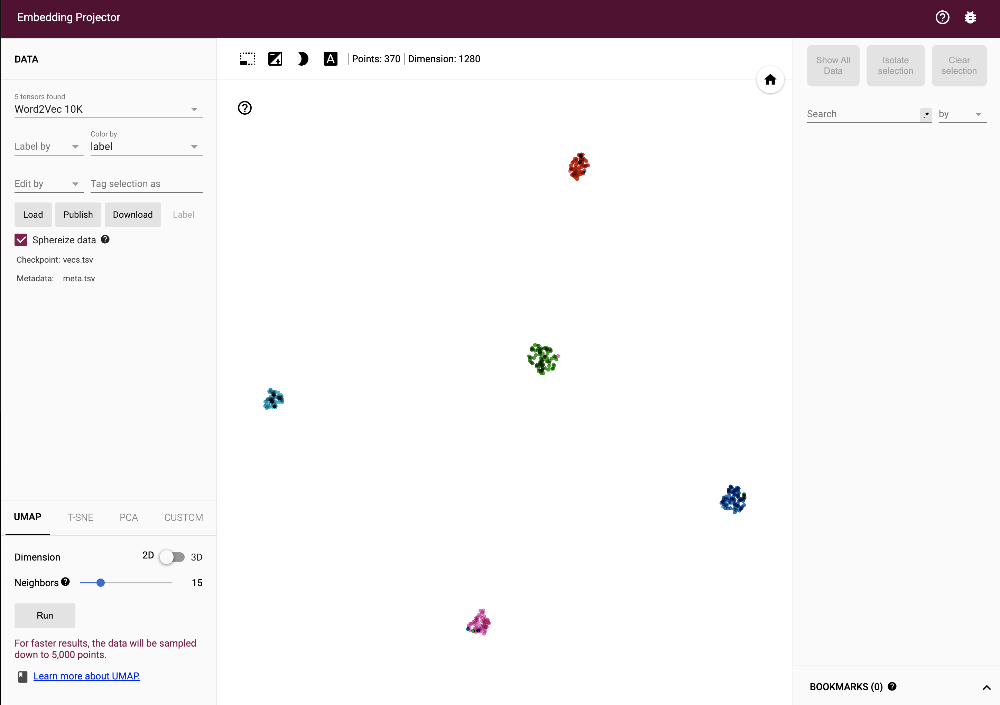

In [16]:
from IPython.display import Image
Image('embedding_projection.png', width=512, height=512)

## その他のサンプル
その他のサンプルをランダムに取得し、実際の画像検索をいくつか確認してみましょう。

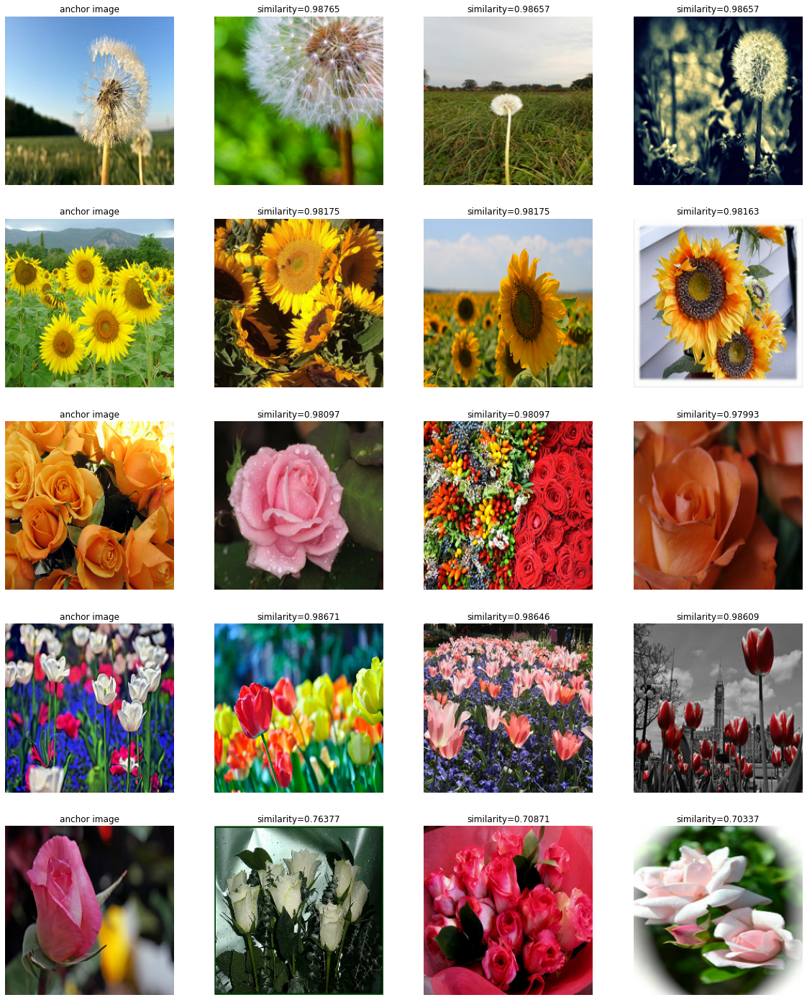

In [17]:
query_filenames, query_embeddings = create_embeddings_dataset(
    lambda x: triplet_loss_model.predict(x),
    "gs://practical-ml-vision-book/flowers_5_jpeg/flower_photos/eval_set.csv", 5, True
)
neighbors, similarities = searcher.search_batched(query_embeddings)

plot_neighbors(query_filenames, neighbors, similarities)

## License
Copyright 2022 Google Inc. Licensed under the Apache License, Version 2.0 (the "License"); you may not use this file except in compliance with the License. You may obtain a copy of the License at http://www.apache.org/licenses/LICENSE-2.0 Unless required by applicable law or agreed to in writing, software distributed under the License is distributed on an "AS IS" BASIS, WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied. See the License for the specific language governing permissions and limitations under the License.